#**Project Workshop Notebook**
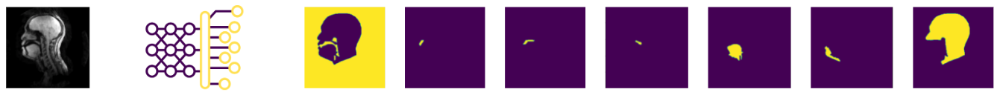

N.B: During all phases of work, except for the debugged training, use Runtime without accelerator. During actual training, set the GPU as a runtime accelerator and disconnect the GPU after each process to avoid Colab GPU restrictions due to runtime limitations.

## DEPENDENCIES

In [1]:
# Dependencies to load the dataset in tf.data format
!pip install med_dataloader==0.1.12 -q

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.7/52.7 MB 18.0 MB/s eta 0:00:00


In [2]:
# Link colab to the directories of a given google drive account
import os
from google.colab import drive

ROOT_PATH = os.path.join(os.sep, 'content' , 'gdrive')
drive.mount(ROOT_PATH)

Mounted at /content/gdrive


In [3]:
# Possible usefull dependencies
import med_dataloader as mdl
import numpy as np

import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl
from tensorflow.keras import Model

from datetime import datetime
from dateutil.tz import gettz
import SimpleITK as sitk

import random
import scipy
from scipy import signal
from scipy.ndimage import median_filter
import cv2
import albumentations as A

import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix
from sklearn.utils import shuffle
import seaborn as sns

import pickle

In [4]:
# Paths
WD_PATH = os.path.join(ROOT_PATH, 'MyDrive', 'ProjectWorkshop_2324')
DATASET_PATH = os.path.join(WD_PATH, 'Dataset', 'Dataset_GS')
MODELS_PATH = os.path.join(WD_PATH, 'Models')

if not os.path.exists(MODELS_PATH):
  os.mkdir(MODELS_PATH)

##DATA EXPLORATION


In [ ]:
# List of unchached images' file name
DATASET2_PATH = os.path.join(WD_PATH, 'Dataset', 'Uncached Dataset','GS_images')

images = os.listdir(DATASET2_PATH)

In [ ]:
# Exctract the subjects
subjects = set([i[:6] for i in images])
subjects = sorted(list(subjects))
subjects

['s00001', 's00002', 's00004', 's00005']

In [ ]:
# Count the images for each subject
images_for_subjects = [0, 0, 0, 0]
for image in images:
    i = subjects.index(image[:6])
    images_for_subjects[i] += 1
images_for_subjects

[280, 240, 150, 150]

In [ ]:
# Class definition
class_labels = {
    0: 'Background',
    1: 'Upper lip',
    2: 'Hard palate',
    3: 'Soft palate',
    4: 'Tongue',
    5: 'Lower lip',
    6: 'Head'
}

NUM_CLASSES = 7

## DATA LOADER (pre filtering)

In [5]:
# Parameters as global variables
NUM_CLASSES = 7
BATCH_SIZE = 8
EPOCHS = 70

In [ ]:
# Data augmentation *args (not necessary)
DATA_AUGMENTATION = False
ROTATION = False
FLIP = False
CROP_SIZE = None

# Percentages for dataset splitting
PERC_TRAIN_DATA = 1
PERC_VALIDATION_DATA = 0
PERC_TEST_DATA = 0

train_ds, validation_ds, test_ds = mdl.get_dataset(data_dir = DATASET_PATH,
                                                    percentages = [PERC_TRAIN_DATA, PERC_VALIDATION_DATA, PERC_TEST_DATA],
                                                    batch_size = BATCH_SIZE,
                                                    train_augmentation = DATA_AUGMENTATION,
                                                    random_crop_size = CROP_SIZE,
                                                    random_rotate = ROTATION,
                                                    random_flip = FLIP,)

x_tot = []
y_tot = []

i = 0
for img, lbl in train_ds.unbatch():
    x_tot.append(img)
    y_tot.append(lbl)
    i += 1

print('Tot Imgs: {}'.format(i))

x_tot = np.asarray(x_tot)
y_tot = np.asarray(y_tot)

print('x_tot shape: {}  y_tot shape: {}'.format(x_tot.shape, y_tot.shape))

Tot Imgs: 820
x_tot shape: (820, 256, 256, 1)  y_tot shape: (820, 256, 256, 7)


In [ ]:
# Random index to plot the images
index = random.randint(0, len(x_tot))

In [ ]:
x_final = x_tot
y_final = y_tot

In [ ]:
np.max(x_final)

1.0

##PREPROCESSING

###Algorithm 1

####GAUSSIAN NOISE REMOVAL

In [ ]:
#pip install opencv-python

In [ ]:
# Function for removing the Gaussian noise
def remove_gaussian_noise(images, output_path):

    # Definition of function's parameters
    kernel_size = (5, 5)
    sigma = 0

    # Read the image
    #img = cv2.imread(image_path)
    img_filtered = [0]*images.shape[0]

    # Implementation of the Gaussian filter to remove the noise
    for i in range (0, images.shape[0]) :
      img_filtered[i] = cv2.GaussianBlur(images[i,:,:,:], kernel_size, sigma)
    temp = np.array(img_filtered)

    # Saving of the filtered image
    #cv2.imwrite(output_path, img_filtered)

    return np.expand_dims(temp,axis=-1)

In [ ]:
output_path = "/content/gdrive/MyDrive/dati_filtrati_1"
filtered_image = remove_gaussian_noise(x_tot, output_path)

filtered_image.shape

(820, 256, 256, 1)

(-0.5, 255.5, 255.5, -0.5)

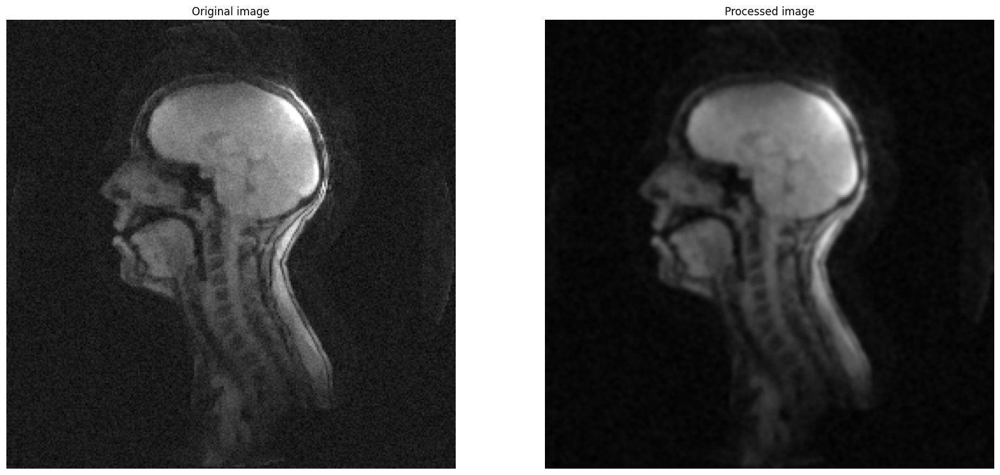

In [ ]:
# Comparison between the original image and the one without the Gaussian noise
plt.figure(figsize=(20,10))

plt.subplot(1,2,1)
plt.imshow(x_tot[index,:,:,0], cmap="gray")
plt.title('Original image')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(filtered_image[index,:,:,0], cmap="gray")
plt.title('Processed image')
plt.axis('off')

(-0.5, 79.5, 79.5, -0.5)

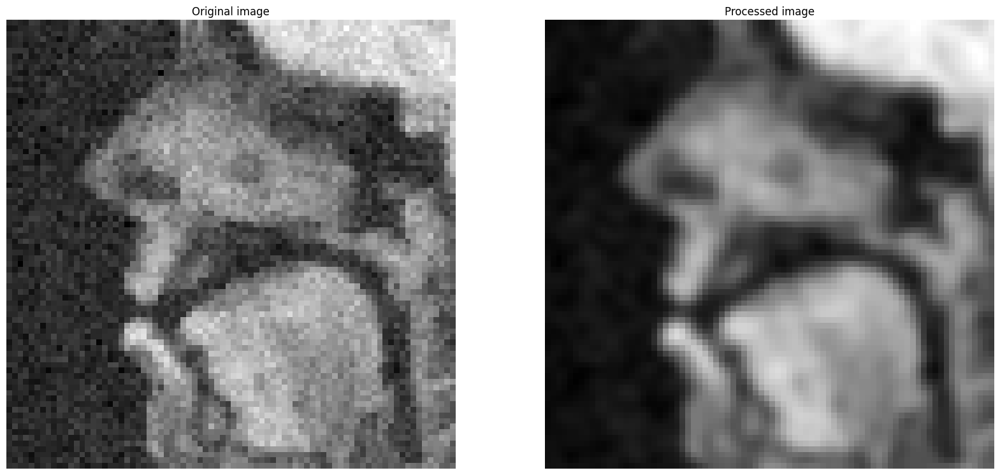

In [ ]:
# Zoom of the two images to see the pixels' resolution
plt.figure(figsize=(20,10))

plt.subplot(1,2,1)
plt.imshow(x_tot[index,70:150,40:120,0], cmap="gray")
plt.title('Original image')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(filtered_image[index,70:150,40:120,0], cmap="gray")
plt.title('Processed image')
plt.axis('off')

#####GAUSSIAN FILTERING EVALUATION

(-0.5, 255.5, 255.5, -0.5)

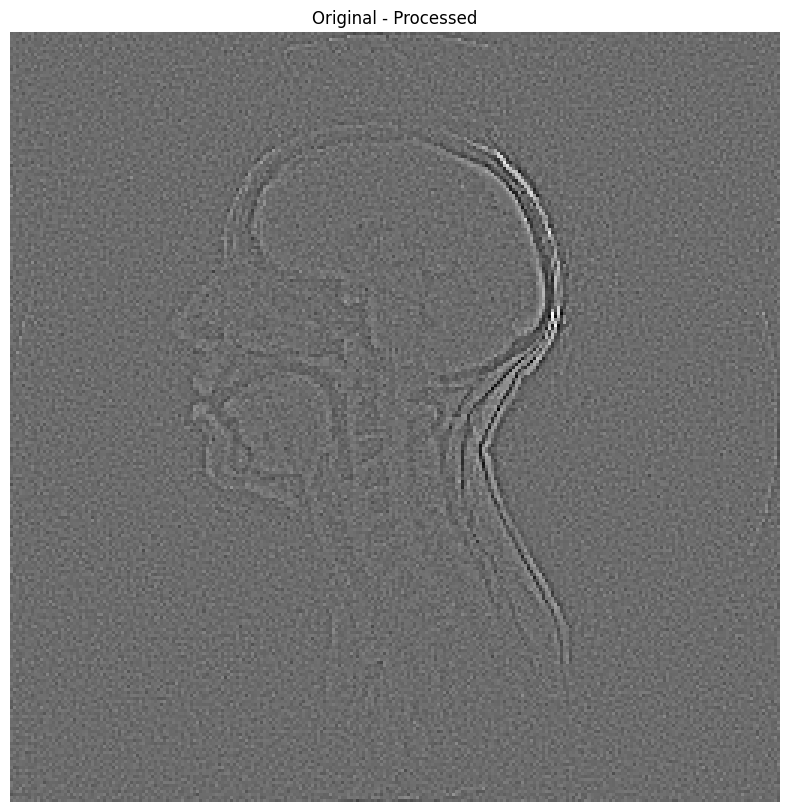

In [ ]:
# Difference between the original image and the one without the Gaussian noise
Diff = x_tot[index,:,:,0]-filtered_image[index,:,:,0]

plt.figure(figsize=(10,10))
plt.imshow(Diff,cmap ="gray")
plt.title('Original - Processed')
plt.axis('off')

Text(0.5, 1.0, 'Noise distribution')

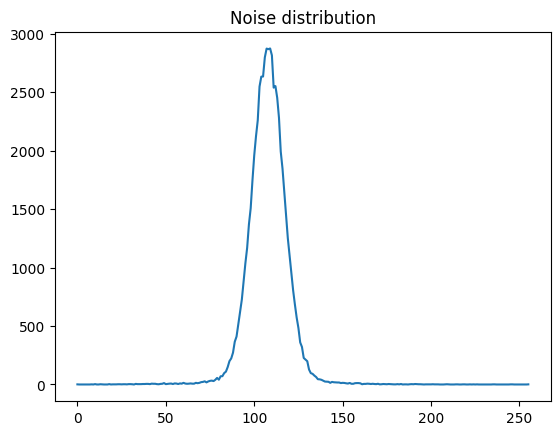

In [ ]:
# Histogram of the difference
plt.plot(np.histogram(Diff, 256)[0])
plt.title('Noise distribution')

We saw that the noise was actually Gaussian and that the image obtained lost contrast. So, we thought we'd try using a high pass filter to enhance the contrast


####HIGH PASS FILTER

In [ ]:
# Function representing the high pass filter
def apply_high_pass_filter(img, output_path):

  # Definition of function's parameters
  kernel = np.array([[-1, -1, -1],
                     [-1,  50, -1],
                     [-1, -1, -1]])
  depth = -1

  # Application of the high pass filter
  img_hf = [0]*img.shape[0]
  for i in range (0,img.shape[0]) :
    img_hf[i] = cv2.filter2D(img[i,:,:,:], depth, kernel)
  temp=np.array(img_hf)

  # Save the filtered image
  #cv2.imwrite(output_path, img_hf)

  return np.expand_dims(temp,axis=-1)

In [ ]:
output_path = "/content/gdrive/MyDrive/dati_filtrati"
hf_image= apply_high_pass_filter(filtered_image, output_path)

hf_image.shape

(820, 256, 256, 1)

(-0.5, 255.5, 255.5, -0.5)

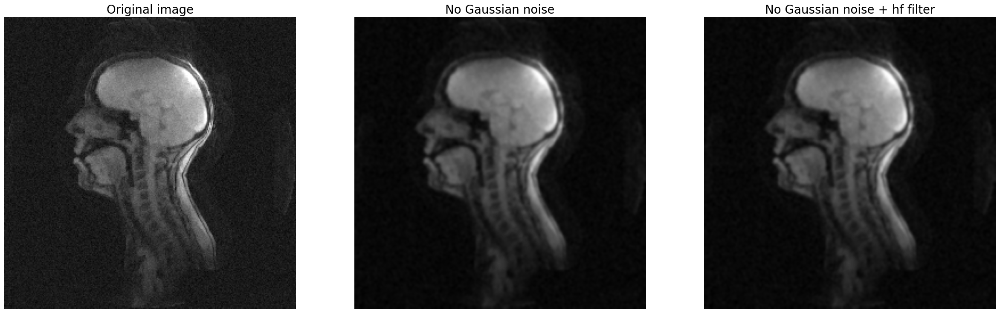

In [ ]:
# Comparison among the original image, the one without the Gaussian noise and the one with applied also the high pass filter
plt.figure(figsize=(30,10))

plt.subplot(1,3,1)
plt.imshow(x_tot[index,:,:,0],cmap="gray")
plt.title('Original image', fontsize=20)
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(filtered_image[index,:,:,0],cmap="gray")
plt.title('No Gaussian noise', fontsize=20)
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(hf_image[index,:,:,0],cmap="gray")
plt.title('No Gaussian noise + hf filter',fontsize=20)
plt.axis('off')

(-0.5, 79.5, 79.5, -0.5)

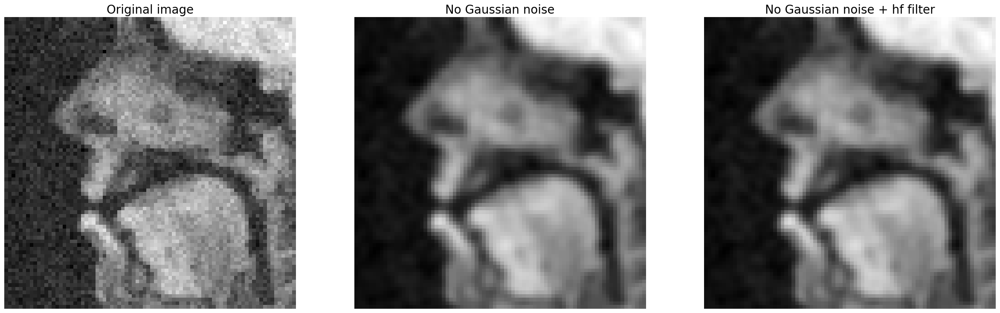

In [ ]:
# Zoom of the two images to see the pixels' resolution
plt.figure(figsize=(30,10))

plt.subplot(1,3,1)
plt.imshow(x_tot[index,70:150,40:120,0],cmap="gray")
plt.title('Original image', fontsize=20)
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(filtered_image[index,70:150,40:120,0],cmap="gray")
plt.title('No Gaussian noise', fontsize=20)
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(hf_image[index,70:150,40:120,0],cmap="gray")
plt.title('No Gaussian noise + hf filter',fontsize=20)
plt.axis('off')

#####HIGH PASS FILTERING EVALUATION

(-0.5, 255.5, 255.5, -0.5)

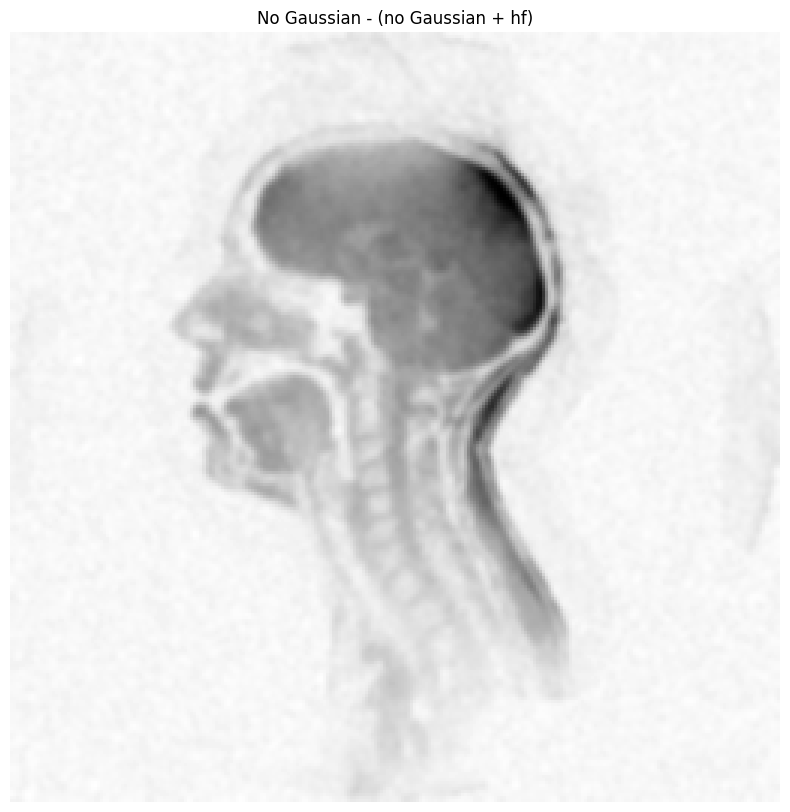

In [ ]:
# Difference between the image without the Gaussian noise and the one with also applied the high pass filter
Diff2 = filtered_image[index,:,:,0]-hf_image[index,:,:,0]

plt.figure(figsize=(10,10))
plt.imshow(Diff2,cmap ="gray")
plt.title('No Gaussian - (no Gaussian + hf)')
plt.axis('off')

Text(0.5, 1.0, 'Noise distribution')

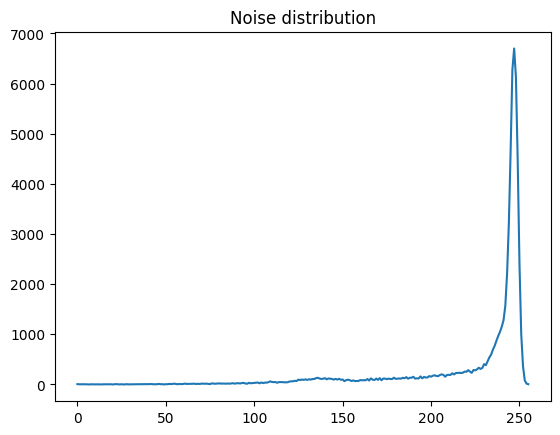

In [ ]:
# Histogram of the difference
plt.plot(np.histogram(Diff2, 256)[0])
plt.title('Noise distribution')

###Algorithm 2

In [ ]:
def denoise(img, weight=0.015, eps=1e-3, num_iter_max=100):
  """
  Rudin, Osher and Fatemi algorithm.
  Perform total-variation denoising on a grayscale image.

  Parameters
  ----------
  img : 2-D input data to be de-noised.
  weight : float, optional. The greater `weight`, the more de-noising
  eps : float, optional. The algorithm stops when:
            (E_(n-1) - E_n) < eps * E_0
  num_iter_max : int, optional

  Returns
  -------
  out : array, De-noised array of floats.

  Source
  -----
  https://github.com/minhducubc97/Image-Processing/blob/master/Denoise/DNmethod2%20%5BBEST%5D.py
  """
  u = np.zeros_like(img)
  px = np.zeros_like(img)
  py = np.zeros_like(img)

  nm = np.prod(img.shape[:2])
  tau = 0.125

  i = 0
  while i < num_iter_max:
      u_old = u
      ux = np.roll(u, -1, axis=1) - u
      uy = np.roll(u, -1, axis=0) - u
      px_new = px + (tau / weight) * ux
      py_new = py + (tau / weight) * uy
      norm_new = np.maximum(1, np.sqrt(px_new **2 + py_new ** 2))
      px = px_new / norm_new
      py = py_new / norm_new
      rx = np.roll(px, 1, axis=1)
      ry = np.roll(py, 1, axis=0)
      div_p = (px - rx) + (py - ry)

      # update image
      u = img + weight * div_p
      error = np.linalg.norm(u - u_old) / np.sqrt(nm)
      if i == 0:
            err_init = error
            err_prev = error
      else:
            # break if error small enough
          if np.abs(err_prev - error) < eps * err_init:
              break
          else:
              e_prev = error

        # don't forget to update iterator
      i += 1

  return u

In [ ]:
def remove_gaussian_noise(dataset):
  """
  given a dataset of images it return the denoised version
  """
  dataset_denoised = denoise(dataset[0,:,:,0])
  dataset_denoised = (dataset_denoised-np.min(dataset_denoised))/(np.max(dataset_denoised)-np.min(dataset_denoised))
  dataset_denoised = np.expand_dims(dataset_denoised,axis=0)

  for img in dataset[1:]:
    new_img = denoise(img[:,:,0])
    new_img = (new_img-np.min(new_img))/(np.max(new_img)-np.min(new_img))
    new_img = np.expand_dims(new_img,axis=0)
    dataset_denoised = np.concatenate((dataset_denoised, new_img), axis=0)

  dataset_denoised = np.expand_dims(dataset_denoised,axis=3)

  return dataset_denoised

In [ ]:
def enhance_high_frequencies(dataset):
  """
  given a dataset of images it returns a version where the high frequency
  components have been enhanced
  """

  h = np.array([[-1, -1, -1],
                [-1, 20, -1],
                [-1, -1, -1]])
  dataset_enhanced = signal.convolve2d(dataset[0,:,:,0], h, mode='same', boundary='symm')
  dataset_enhanced = (dataset_enhanced-np.min(dataset_enhanced))/(np.max(dataset_enhanced)-np.min(dataset_enhanced))
  dataset_enhanced = np.expand_dims(dataset_enhanced,axis=0)

  for img in dataset[1:]:
    next_img = signal.convolve2d(img[:,:,0], h, mode='same', boundary='symm')
    next_img = (next_img-np.min(next_img))/(np.max(next_img)-np.min(next_img))
    next_img = np.expand_dims(next_img,axis=0)
    dataset_enhanced = np.concatenate((dataset_enhanced, next_img), axis=0)

  dataset_enhanced = np.expand_dims(dataset_enhanced,axis=3)

  return dataset_enhanced

In [ ]:
'''
def preprocessing(dataset):
  dataset = remove_gaussian_noise(dataset)
  dataset = enhance_high_frequencies(dataset)
  return dataset
'''

In [ ]:
#x_tot_denoised = preprocessing(x_tot)

In [ ]:
x_tot_denoised = remove_gaussian_noise(x_tot)
x_tot_denoised_ehf = enhance_high_frequencies(x_tot_denoised)

(-0.5, 255.5, 255.5, -0.5)

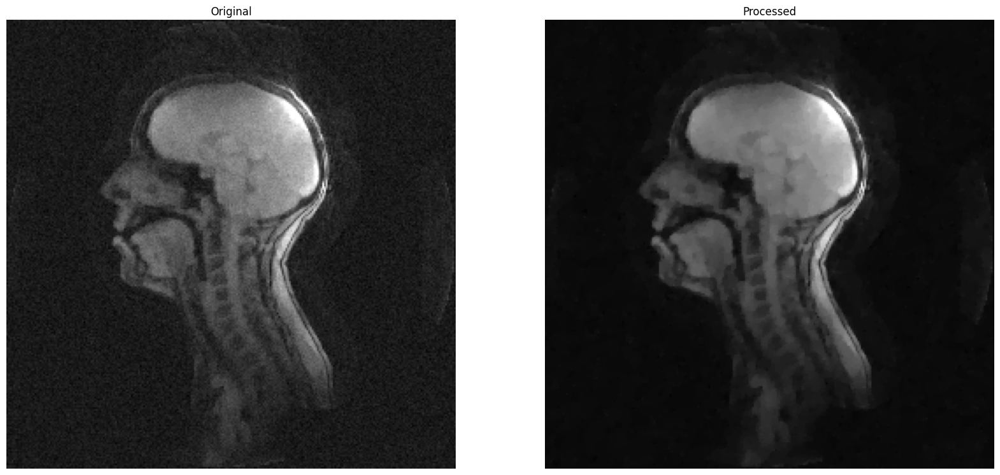

In [ ]:
# Comparison among the original image and the processed one (gaussian noise removal only)
plt.figure(figsize=(20,10))

plt.subplot(1,2,1)
plt.imshow(x_tot[index,:,:,0], cmap="gray")
plt.title('Original')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(x_tot_denoised[index,:,:,0], cmap="gray")
plt.title('Processed')
plt.axis('off')

(-0.5, 79.5, 79.5, -0.5)

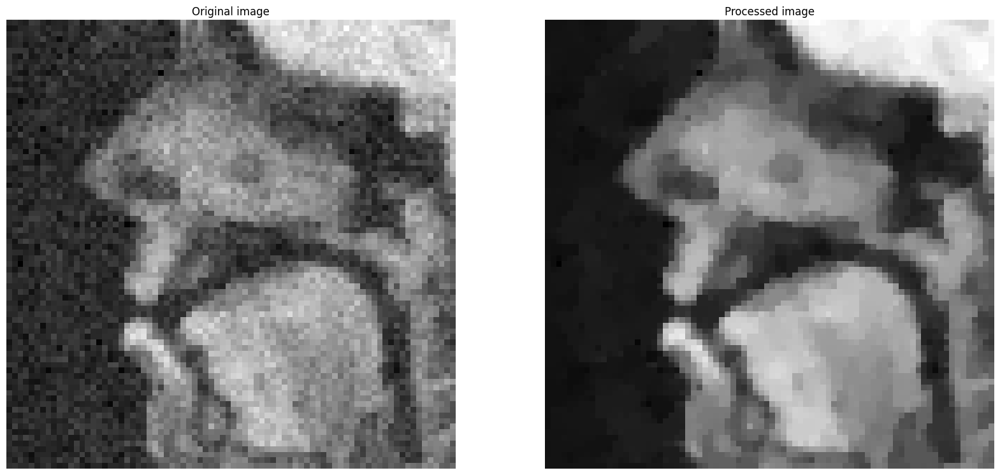

In [ ]:
# Zoom of the two images to see the pixels' resolution
plt.figure(figsize=(20,10))

plt.subplot(1,2,1)
plt.imshow(x_tot[index,70:150,40:120,0], cmap="gray")
plt.title('Original image')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(x_tot_denoised[index,70:150,40:120,0], cmap="gray")
plt.title('Processed image')
plt.axis('off')

(-0.5, 255.5, 255.5, -0.5)

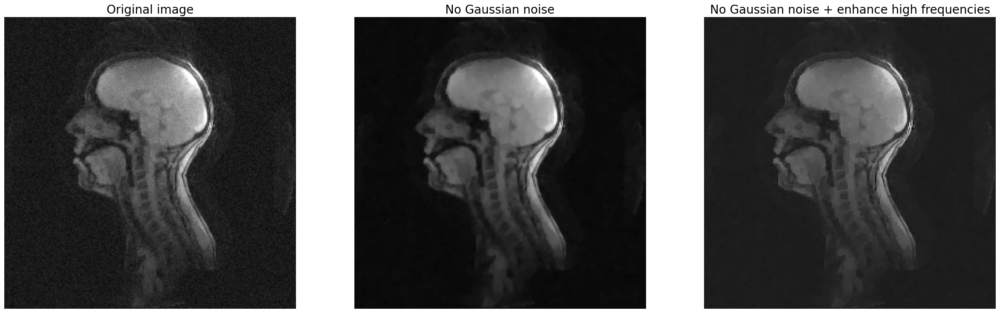

In [ ]:
# Comparison among the original image, the one without the Gaussian noise and the one with applied also the enhanced high frequencies
plt.figure(figsize=(30,10))

plt.subplot(1,3,1)
plt.imshow(x_tot[index,:,:,0],cmap="gray")
plt.title('Original image', fontsize=20)
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(x_tot_denoised[index,:,:,0],cmap="gray")
plt.title('No Gaussian noise', fontsize=20)
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(x_tot_denoised_ehf[index,:,:,0],cmap="gray")
plt.title('No Gaussian noise + enhance high frequencies',fontsize=20)
plt.axis('off')

(-0.5, 79.5, 79.5, -0.5)

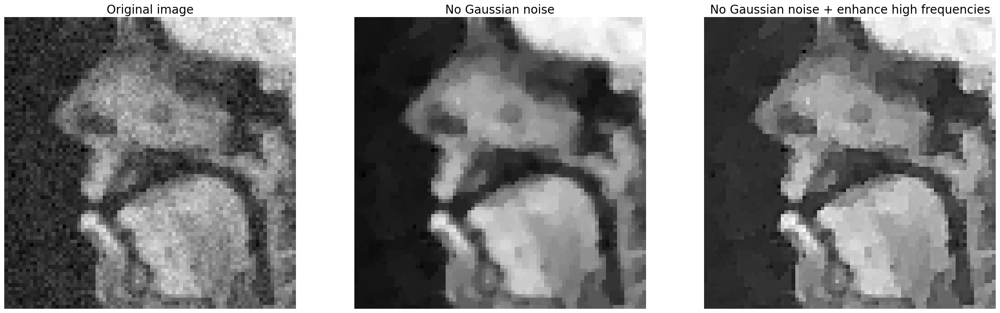

In [ ]:
# Zoom of the two images to see the pixels' resolution
plt.figure(figsize=(30,10))

plt.subplot(1,3,1)
plt.imshow(x_tot[index,70:150,40:120,0],cmap="gray")
plt.title('Original image', fontsize=20)
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(x_tot_denoised[index,70:150,40:120,0],cmap="gray")
plt.title('No Gaussian noise', fontsize=20)
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(x_tot_denoised_ehf[index,70:150,40:120,0],cmap="gray")
plt.title('No Gaussian noise + enhance high frequencies',fontsize=20)
plt.axis('off')

###Algorithm 3

In [ ]:
#pip install opencv-python

In [ ]:
x_tot_norm = cv2.normalize(x_tot, None, 0, 255, cv2.NORM_MINMAX)
x_tot_u8 = x_tot_norm.astype(np.uint8)

In [ ]:
# Function for removing the Gaussian noise
def remove_gaussian_noise(images, output_path):

    # Read the image
    #img = cv2.imread(image_path)
    img_filtered = [0]*images.shape[0]

    # Implementation of the Gaussian filter to remove the noise
    for i in range (0,images.shape[0]) :
      img_filtered[i] =cv2.fastNlMeansDenoising(images[i,:,:,:], None, h=5, templateWindowSize=11, searchWindowSize=41)
    temp=np.array(img_filtered)

    # Saving of the filtered image
    #cv2.imwrite(output_path, img_filtered)

    return np.expand_dims(temp,axis=-1)

In [ ]:
output_path = "/content/gdrive/MyDrive/dati_filtrati"
x_tot3_u8=remove_gaussian_noise(x_tot_u8, output_path)
x_tot3=x_tot3_u8.astype(np.float32)

x_tot3.shape

(820, 256, 256, 1)

In [ ]:
np.save('/content/gdrive/MyDrive/x_tot3.npy', x_tot3)
np.save('/content/gdrive/MyDrive/y_tot.npy', y_tot)
np.save('/content/gdrive/MyDrive/x_tot.npy', x_tot)

(-0.5, 255.5, 255.5, -0.5)

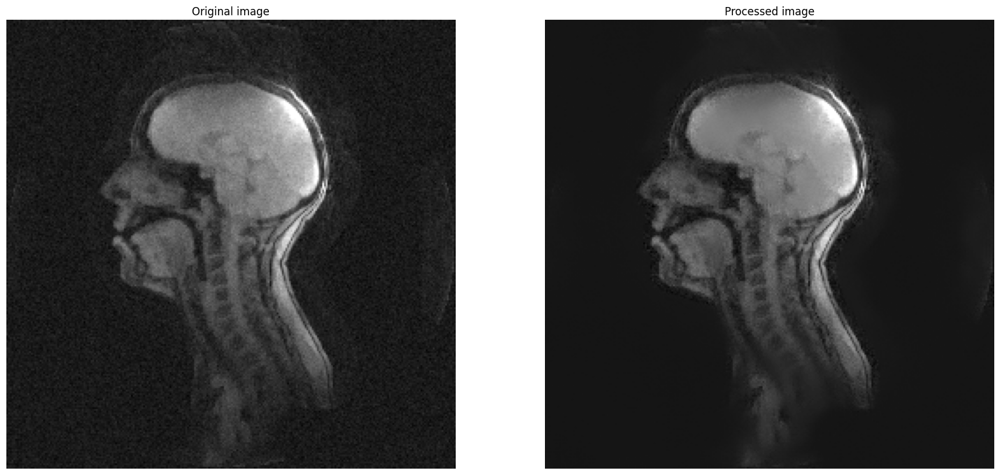

In [ ]:
# Comparison between the original image and the one without the Gaussian noise
plt.figure(figsize=(20,10))

plt.subplot(1,2,1)
plt.imshow(x_tot[index,:,:,0], cmap="gray")
plt.title('Original image')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(x_tot3[index,:,:,0], cmap="gray")
plt.title('Processed image')
plt.axis('off')

(-0.5, 79.5, 79.5, -0.5)

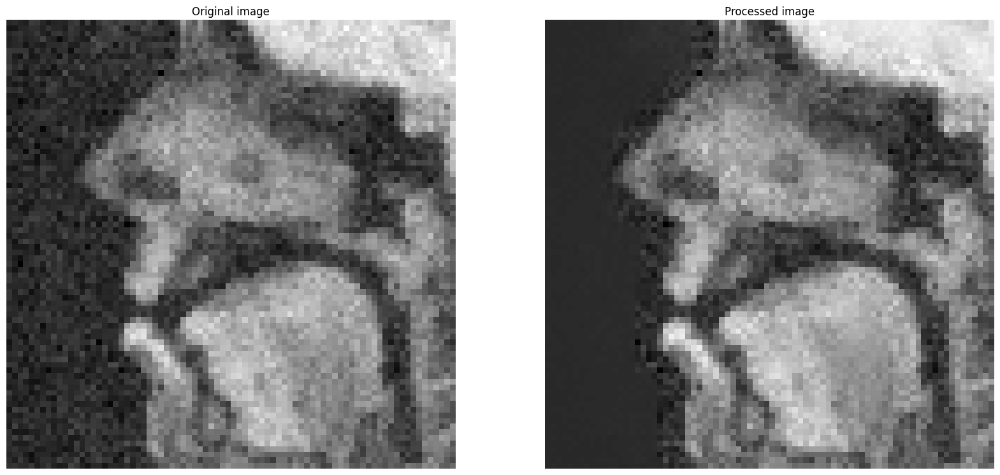

In [ ]:
# Zoom of the two images to see the pixels' resolution
plt.figure(figsize=(20,10))

plt.subplot(1,2,1)
plt.imshow(x_tot[index,70:150,40:120,0], cmap="gray")
plt.title('Original image')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(x_tot3[index,70:150,40:120,0], cmap="gray")
plt.title('Processed image')
plt.axis('off')

####GAUSSIAN FILTERING EVALUATION

(-0.5, 255.5, 255.5, -0.5)

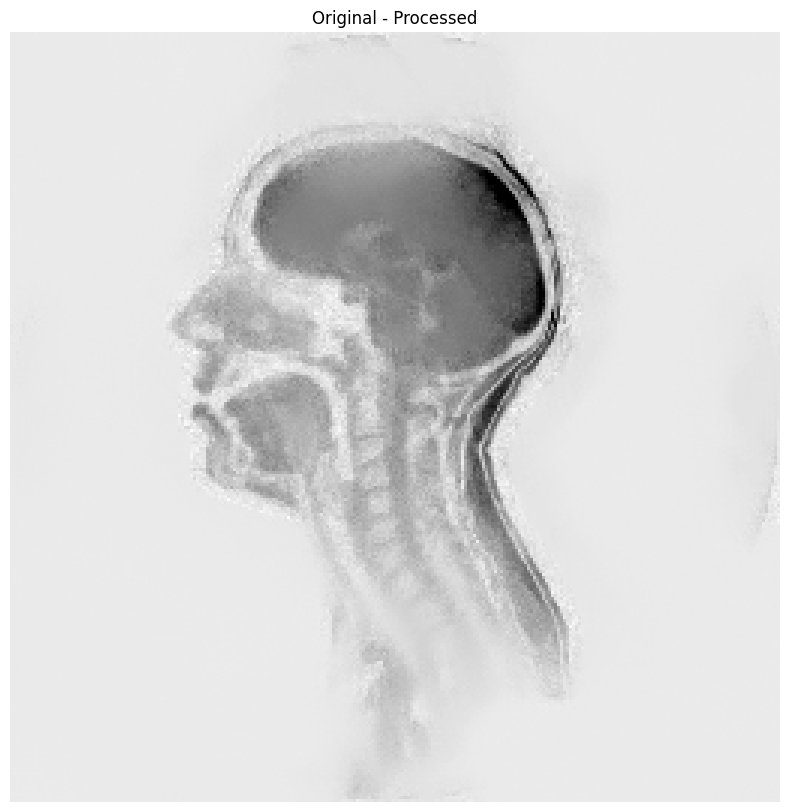

In [ ]:
# Difference between the original image and the one without the Gaussian noise
Diff = x_tot[index,:,:,0]-x_tot3[index,:,:,0]

plt.figure(figsize=(10,10))
plt.imshow(Diff,cmap ="gray")
plt.title('Original - Processed')
plt.axis('off')

Text(0.5, 1.0, 'Distibution of difference')

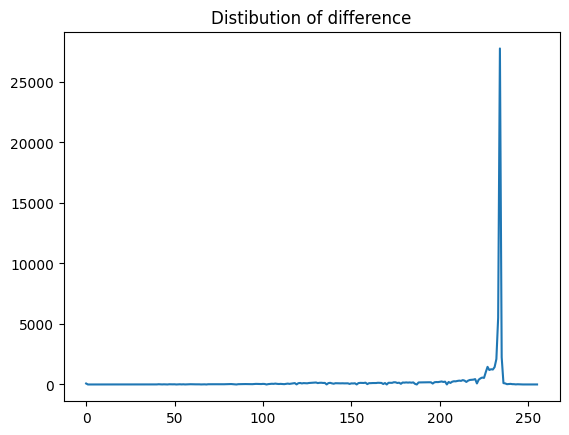

In [ ]:
# Histogram of the difference
plt.plot(np.histogram(Diff, 256)[0])
plt.title('Distibution of difference')

## DATA LOAD (post filtering)

In [6]:
x_final =  np.load('/content/gdrive/MyDrive/Voice tract segmentation/dati_filtrati/x_tot3.npy')
y_final =  np.load('/content/gdrive/MyDrive/Voice tract segmentation/dati_filtrati/y_tot.npy')

In [7]:
x_final.shape

(820, 256, 256, 1)

##DATASET VISUALIZATION

  Img n°: 0 ↓ 


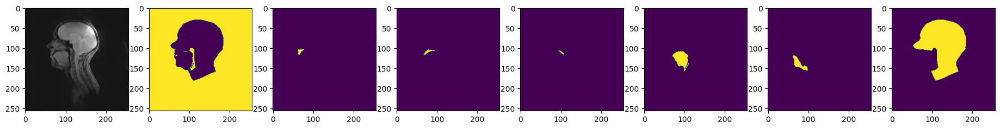

  Img n°: 1 ↓ 


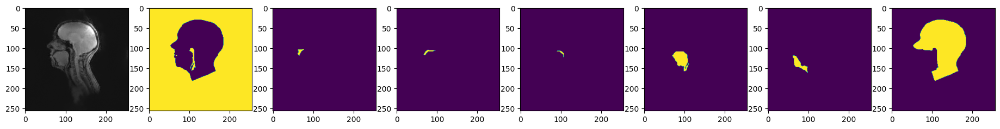

  Img n°: 2 ↓ 


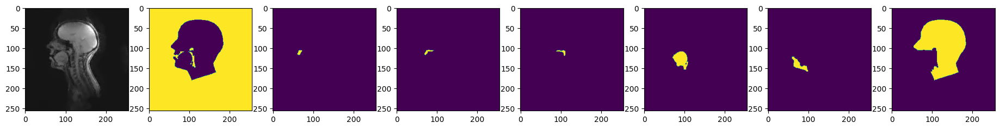

  Img n°: 3 ↓ 


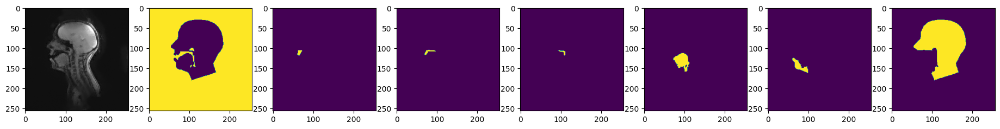

  Img n°: 4 ↓ 


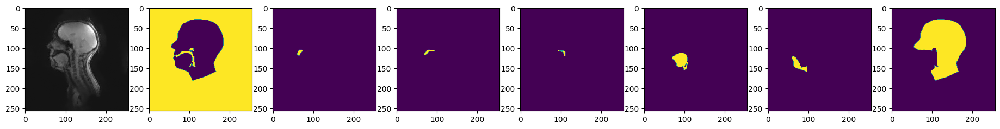

In [ ]:
n = 0
for volume, label in zip(x_final[:5,:,:,:], y_final[:5,:,:,:]):

    print("\033[92m \033[1m Img n°: {} ↓ \033[0m".format(n))
    fig = plt.figure(figsize = [23, 7])
    plt.subplot(1, NUM_CLASSES + 1, 1)
    plt.imshow(volume[:,:,0], cmap="gray")

    for i in range(NUM_CLASSES):
        plt.subplot(1, NUM_CLASSES + 1, i+2)
        plt.imshow(label[:,:,i])

    n += 1
    plt.show(fig)

## SPLITTING

In [8]:
# Training set
x_train = x_final[:520]
y_train = y_final[:520]
print('x_train shape: {}  y_train shape: {}'.format(x_train.shape, y_train.shape))

# Validation set
x_val = x_final[520:-150]
y_val = y_final[520:-150]
print('x_val shape: {}  y_val shape: {}'.format(x_val.shape, y_val.shape))

# Test set
x_test = x_final[-150:]
y_test = y_final[-150:]
print('x_test shape: {}  y_test shape: {}'.format(x_test.shape, y_test.shape))

x_train shape: (520, 256, 256, 1)  y_train shape: (520, 256, 256, 7)
x_val shape: (150, 256, 256, 1)  y_val shape: (150, 256, 256, 7)
x_test shape: (150, 256, 256, 1)  y_test shape: (150, 256, 256, 7)


##DATA AUGMENTATION


In [ ]:
# Set seed for same augmentation
seed = 42

random.seed(seed)
np.random.seed(seed)

In [ ]:
# Define the types of augmentation to apply
augmentation = A.Compose([
    #A.ShiftScaleRotate(shift_limit_x=(-30, 30), shift_limit_y=(0, -30),scale_limit=0.40, rotate_limit=(-10, 30), p=0.5, border_mode=1),   # paper directives
    A.ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.50, rotate_limit=20, p=0.5, border_mode=1)
    ])

In [ ]:
def data_augmentation(x_train, y_train, augmentation):
  """
  Given a dataset with relative masks, it apply data augmentation and return the
  combination of the original dataset and the augmented one shuffled.
  The dimensions of the dataset double
  """
  x_train_aug = x_train
  y_train_aug = y_train

  for i in range(len(x_train)):
    img = x_train[i,:,:,0]
    mask = y_train[i,:,:,:]

    augmented = augmentation(image=img, mask=mask)

    img = augmented['image']
    mask = augmented['mask']

    x_train_aug[i,:,:,0] = img
    y_train_aug[i,:,:,:] = mask

  x_train = np.concatenate((x_train, x_train_aug), axis = 0)
  y_train = np.concatenate((y_train, y_train_aug), axis = 0)

  p = np.random.permutation(len(x_train))
  return x_train[p], y_train[p]

In [ ]:
x_train, y_train = data_augmentation(x_train, y_train, augmentation)

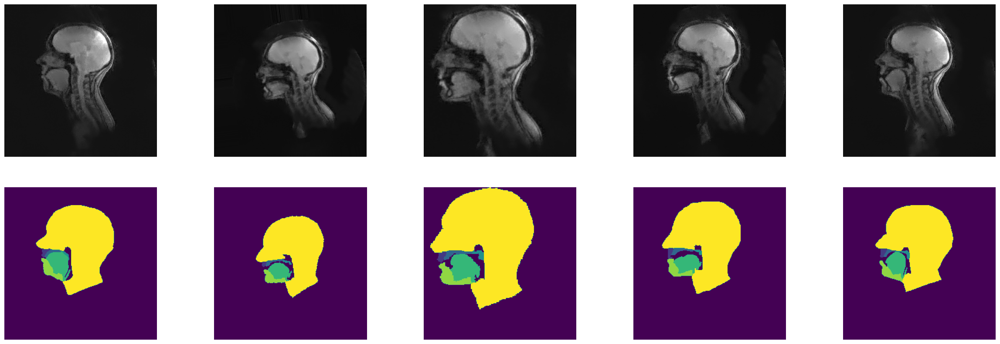

In [ ]:
# Plot random images with masks to see effects of data augmentation
plt.figure(figsize=(30,10))

imgs = np.random.randint(0, len(x_train), (1,5))

for i in range(10):
  plt.subplot(2,5,i+1)
  if i<5:
    j = imgs[0][i]
    plt.imshow(x_train[j,:,:,0], cmap="gray")
    plt.axis('off')
  else:
    j = imgs[0][i%5]
    plt.imshow(tf.math.argmax(y_train[j], axis=-1))
    plt.axis('off')

##SHUFFLE

In [ ]:
# Shuffle of the training set
x_train, y_train = shuffle(x_train, y_train, random_state=0)

##WEIGHTS

In [9]:
# Weights definition
tot_pix = 256*256*y_train.shape[0]
w = np.ones([7,3])

for c in range(7):
  w[c,1] = tot_pix/np.sum(y_train[...,c])   # paper directives
  w[c,2] = 1 - (np.sum(y_train[...,c])/tot_pix)   # different weights definition

## LOSS FUNCTION

Cross Entropy:  $\, L_{CE} = -\sum_{c=1}^{C} \frac{1}{N} \sum_{i=1}^{N} g_i^c\,log\,p_i^c \quad$ [[1]](https://www.sciencedirect.com/science/article/pii/S1361841521000815)

where:
* $C$ = n°classes
* $N$ = n°pixels of image (256x256)
* $g_i^c$ = value of the $i^{th}$ pixel of the $c^{th}$ class of the ground truth label
* $p_i^c$ = value of the $i^{th}$ pixel of the $c^{th}$ class of the predicted label

In [23]:
def cross_entropy(num_classes,weights = 0):
  #weights = 0 --> all ones (we are not weighting the fz)
  #weights = 1 --> tot_pixels/pixels for classes(paper)
  #weights = 2 --> 1 - (pixels for classes)/tot_pixels (our implementation to avoid having too high weights)

    def loss(y_true, y_pred): #called each iteration (step)

        if len(y_pred.shape) == 4: #2D image
            axis = (1,2)
        elif len(y_pred.shape) == 5: #3D volume
            axis == (1,2,3)

        y_true = tf.cast(y_true, dtype = tf.float32)
        y_pred = tf.cast(y_pred, dtype = tf.float32)

        loss_image = 0.0
        loss_ce = 0.0

        for c in range(num_classes):

            loss_image = tf.math.add(-1*w[c,weights]*(tf.math.reduce_mean(tf.math.multiply(y_true[...,c], tf.math.log(y_pred[...,c] + 1e-9)), axis = axis)), loss_image)

        loss_ce = tf.math.reduce_mean(loss_image)

        return loss_ce

    return loss

## METRIC

### MEAN DICE
$\, DICE = \frac{1}{C}  \sum_{c = 1}^{C} \frac{2 \lvert S_g^c \cap S_p^c \rvert}{\lvert S_g^c \rvert + \lvert S_p^c \rvert} = \frac{2\,\sum_{c=1}^{C}\sum_{i=1}^{N}g_i^c\,p_i^c}{\sum_{c=1}^{C}\sum_{i=1}^{N}g_i^c \,+\, \sum_{c=1}^{C}\sum_{i=1}^{N}p_i^c  } \quad$ [[3]](https://bmcmedimaging.biomedcentral.com/track/pdf/10.1186/s12880-015-0068-x.pdf)

In [10]:
class Mean_DICE(tf.keras.metrics.Metric):
    def __init__(self,
                 num_classes,
                 name='Mean_DICE',
                 smooth_factor = 1e-9,
                 **kwargs):

        super().__init__(name = name, **kwargs)
        self.num_classes = num_classes
        self.axis = None
        self.smooth_factor = smooth_factor

    def update_state(self, y_true, y_pred, sample_weight=None):

        num_classes = self.num_classes
        y_true = tf.cast(y_true, dtype = tf.float32)
        y_pred = tf.cast(y_pred, dtype = tf.float32)

        dice_classes = 0.0
        dice_image = 0.

        if len(y_pred.shape) == 4:
            self.axis = (1,2)
        elif len(y_pred.shape) == 5:
            self.axis = (1,2,3)

        for c in range(num_classes):

            abs_label = tf.math.reduce_sum(y_true[...,c], axis = self.axis )
            abs_pred = tf.math.reduce_sum(y_pred[...,c], axis = self.axis )
            MD_batch_denom = tf.math.add(tf.math.add(abs_label, abs_pred), self.smooth_factor)
            MD_batch_num = tf.math.add(2*tf.math.reduce_sum(tf.math.multiply(y_true[...,c], y_pred[...,c]), axis = self.axis), self.smooth_factor)
            dice_image = tf.math.divide(MD_batch_num, MD_batch_denom)
            dice_classes = tf.math.add(dice_image, dice_classes)

        self.mean_dice = tf.math.divide(dice_classes, num_classes)
        self.mean_dice = tf.math.reduce_mean(self.mean_dice)

    def result(self):
        return self.mean_dice

    def get_config(self):
        config = super().get_config()
        config.update({'num_classes': self.num_classes})
        return config

    @ classmethod
    def from_config(cls, config):
        return cls(**config)

### PRECISION

In [11]:
precision = [tf.keras.metrics.Precision(class_id = i, name = f'precision_{i}') for i in range(NUM_CLASSES)]

### ACCURACY

In [12]:
accuracy = [tf.keras.metrics.CategoricalAccuracy(name=f'accuracy_{i}') for i in range(NUM_CLASSES)]

### RECALL

In [13]:
recall = [tf.keras.metrics.Recall(class_id = i, name=f'recall_{i}') for i in range(NUM_CLASSES)]

## CALLBACKS

In [14]:
class VizCallback(tf.keras.callbacks.Callback):

    def __init__(self, image, label, folder_path):
        super().__init__()
        self.image = image
        self.label = label
        self.folder_path = folder_path

    def on_epoch_end(self, epoch, logs=None):
        pred = model.predict(self.image, verbose=0)
        y_pred = tf.math.argmax(pred, axis=-1)
        y_pred = np.array(y_pred)
        y_pred = np.reshape(y_pred, (256, 256))

        y_label = tf.math.argmax(self.label, axis=-1)
        y_label = np.array(y_label)
        y_label = np.reshape(y_label, (256, 256))


        fig = plt.figure()
        ax1 = fig.add_subplot(1,2,1)
        ax1.imshow(y_label)
        plt.axis('off')
        ax1.set_title('Label')

        ax2 = fig.add_subplot(1,2,2)
        ax2.imshow(y_pred)
        ax2.set_title('Prediction')
        plt.axis('off')
        plt.tight_layout()

        extent = ax2.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
        path = os.path.join(self.folder_path, str(epoch))
        fig.savefig(path, bbox_inches=extent.expanded(1, 0.75))

        plt.show()

In [15]:
#Create a directory tree to neatly save the models
checkpoint_path = '/content/gdrive/MyDrive/Voice tract segmentation/models/newmodel_aug_weights2_skipconnection'
predictions_path = '/content/gdrive/MyDrive/Voice tract segmentation/models/newmodel_aug_weights2_skipconnection/Predictions Images'

if not os.path.exists(checkpoint_path):
    os.mkdir(checkpoint_path)
if not os.path.exists(predictions_path):
    os.mkdir(predictions_path)

In [16]:
patience = 30

early_stopping = tfk.callbacks.EarlyStopping(monitor='val_Mean_DICE', mode='max', patience=patience, restore_best_weights=True)
scheduler = tfk.callbacks.ReduceLROnPlateau(monitor='val_Mean_DICE', mode='max', factor=0.9, patience=10, min_lr=1e-8)
tensor_board = tf.keras.callbacks.TensorBoard(log_dir= checkpoint_path, histogram_freq=1)

## ARCHITECTURE

### BLOCKS DEFINITION : PAPER

In [ ]:
def u_net_encoder_block(input_image,num_filters, text, drop_out=False,max_pooling=True):
  x = input_image

  if max_pooling:
    x = tfkl.MaxPooling2D(pool_size=(2,2),strides=(2,2),name='max_pool_'+text)(x)

  x = tfkl.Conv2D(num_filters,kernel_size=3,padding='same',name='Conv_1_'+text)(x)
  x = tfkl.BatchNormalization(name='batch_1_'+text)(x)
  x = tfkl.Activation('relu', name='act_1_'+text)(x)
  if drop_out:
    x = tfkl.Dropout(0.5, name='DropOut_1_'+text)(x)

  x = tfkl.Conv2D(num_filters,kernel_size=3 ,padding='same',name='Conv_2_'+text)(x)
  x = tfkl.BatchNormalization(name='batch_2_'+text)(x)
  x = tfkl.Activation('relu',name='act_2_'+text)(x)
  if drop_out:
      x = tfkl.Dropout(0.5, name='DropOut_2_'+text)(x)

  return x

In [ ]:
def u_net_decoder_block(input_image,num_filters, text, skip_con):
  x = input_image

  x = tfkl.Conv2DTranspose(num_filters,kernel_size=2,strides=(2,2),padding='same')(x)
  x = tfkl.Concatenate(name='skip_'+text)([x,skip_con])

  x = tfkl.Conv2D(num_filters,kernel_size=3,padding='same',name='Conv_1_'+text)(x)
  x = tfkl.BatchNormalization(name='batch_1_'+text)(x)
  x = tfkl.Activation('relu', name='act_1_'+text)(x)

  x = tfkl.Conv2D(num_filters,kernel_size=3 ,padding='same',name='Conv_2_'+text)(x)
  x = tfkl.BatchNormalization(name='batch_2_'+text)(x)
  x = tfkl.Activation('relu',name='act_2_'+text)(x)

  return x

### BLOCKS DEFINITION : SKIP CONNECTIONS



In [17]:
def u_net_encoder_block(input_image, num_filters, text, drop_out=False, max_pooling=True):
    x = input_image

    if max_pooling:
        x = tfkl.MaxPooling2D(pool_size=(2, 2), strides=(2, 2), name='max_pool_' + text)(x)

    # Save the input for the skip connection
    skip_connection = x

    x = tfkl.Conv2D(num_filters, kernel_size=3, padding='same', name='Conv_1_' + text)(x)
    x = tfkl.BatchNormalization(name='batch_1_' + text)(x)
    x = tfkl.Activation('relu', name='act_1_' + text)(x)
    if drop_out:
        x = tfkl.Dropout(0.5, name='DropOut_1_' + text)(x)

    x = tfkl.Conv2D(num_filters, kernel_size=3, padding='same', name='Conv_2_' + text)(x)
    x = tfkl.BatchNormalization(name='batch_2_' + text)(x)
    x = tfkl.Activation('relu', name='act_2_' + text)(x)
    if drop_out:
        x = tfkl.Dropout(0.5, name='DropOut_2_' + text)(x)

    # Add the skip connection
    x = tfkl.Concatenate(name='skip_conn_' + text)([x, skip_connection])

    return x

In [18]:
def u_net_decoder_block(input_image, num_filters, text, skip_con):
    x = input_image

    x = tfkl.Conv2DTranspose(num_filters, kernel_size=2, strides=(2, 2), padding='same')(x)
    x = tfkl.Concatenate(name='skip_' + text)([x, skip_con])

    # Save the input for the skip connection
    skip_connection = x

    x = tfkl.Conv2D(num_filters, kernel_size=3, padding='same', name='Conv_1_' + text)(x)
    x = tfkl.BatchNormalization(name='batch_1_' + text)(x)
    x = tfkl.Activation('relu', name='act_1_' + text)(x)

    x = tfkl.Conv2D(num_filters, kernel_size=3, padding='same', name='Conv_2_' + text)(x)
    x = tfkl.BatchNormalization(name='batch_2_' + text)(x)
    x = tfkl.Activation('relu', name='act_2_' + text)(x)

    # Add the skip connection
    x = tfkl.Concatenate(name='skip_conn_' + text)([x, skip_connection])

    return x

### UNET

In [20]:
def u_net_model(input_shape=[256,256,1]):
  input_layer = tfkl.Input(shape=input_shape, name='input_layer')

  # Encoder blocks
  e1 = u_net_encoder_block(input_layer,64,'e1',max_pooling=False)

  e2 = u_net_encoder_block(e1,128,'e2')

  e3 = u_net_encoder_block(e2,256,'e3')

  e4 = u_net_encoder_block(e3,512,'e4',drop_out=True)

  e5 = u_net_encoder_block(e4,1024,'e5',drop_out=True)


  # Decoder blocks
  d1 = u_net_decoder_block(e5, 512, 'd1', e4)

  d2 = u_net_decoder_block(d1, 256, 'd2', e3)

  d3 = u_net_decoder_block(d2, 128, 'd3', e2)

  d4 = u_net_decoder_block(d3, 64, 'd4', e1)


  # Output layer -> since the last layer has 7 channels, the different labels should remain separated (we don't need to merge them into a single image containing all the different parts)
  output_layer = tfkl.Conv2D(7, kernel_size=3, padding='same', activation="softmax", name='output_layer')(d4)


  # Model
  model = tf.keras.Model(inputs=input_layer, outputs=output_layer)

  return model

## MODEL

In [21]:
model = u_net_model()
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_layer (InputLayer)    [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 Conv_1_e1 (Conv2D)          (None, 256, 256, 64)         640       ['input_layer[0][0]']         
                                                                                                  
 batch_1_e1 (BatchNormaliza  (None, 256, 256, 64)         256       ['Conv_1_e1[0][0]']           
 tion)                                                                                            
                                                                                                  
 act_1_e1 (Activation)       (None, 256, 256, 64)         0         ['batch_1_e1[0][0]']      

In [24]:
model.compile(
    loss = cross_entropy(7, 0),   # weights: 0, 1 or 2
    optimizer = tfk.optimizers.Adam(learning_rate=0.0001,epsilon=1e-08),
    metrics = [Mean_DICE(7), precision, accuracy, recall]
    )


In [25]:
print(np.max(x_train))
print(np.max(x_val))

255.0
255.0


In [26]:
x_train = x_train/255
x_val = x_val/255

TENSOR BOARD

In [ ]:
!kill $(sudo lsof -t -i:6006)

kill: usage: kill [-s sigspec | -n signum | -sigspec] pid | jobspec ... or kill -l [sigspec]


In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir "$checkpoint_path"

<IPython.core.display.Javascript object>

In [ ]:
#if the upper row doesn't work, run this after
from google.colab import output
output.serve_kernel_port_as_window(6006, path="")

<IPython.core.display.Javascript object>

MODEL FIT

Epoch 1/100


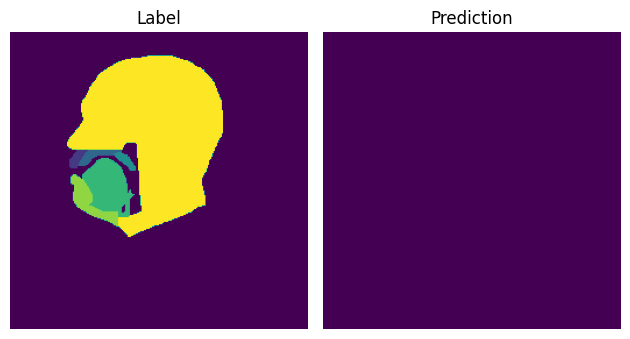

70/70 - 183s - loss: 0.1302 - Mean_DICE: 0.5329 - precision_0: 0.9942 - precision_1: 0.0019 - precision_2: 0.0018 - precision_3: 0.0037 - precision_4: 0.8632 - precision_5: 0.7197 - precision_6: 0.8544 - accuracy_0: 0.9211 - accuracy_1: 0.9211 - accuracy_2: 0.9211 - accuracy_3: 0.9211 - accuracy_4: 0.9211 - accuracy_5: 0.9211 - accuracy_6: 0.9211 - recall_0: 0.8468 - recall_1: 3.9808e-04 - recall_2: 0.0013 - recall_3: 9.7204e-06 - recall_4: 0.5634 - recall_5: 0.3847 - recall_6: 0.9089 - val_loss: 0.5910 - val_Mean_DICE: 0.1393 - val_precision_0: 0.7632 - val_precision_1: 0.0000e+00 - val_precision_2: 0.0000e+00 - val_precision_3: 0.0000e+00 - val_precision_4: 0.0000e+00 - val_precision_5: 0.0000e+00 - val_precision_6: 0.0000e+00 - val_accuracy_0: 0.7635 - val_accuracy_1: 0.7635 - val_accuracy_2: 0.7635 - val_accuracy_3: 0.7635 - val_accuracy_4: 0.7635 - val_accuracy_5: 0.7635 - val_accuracy_6: 0.7635 - val_recall_0: 0.9982 - val_recall_1: 0.0000e+00 - val_recall_2: 0.0000e+00 - val_rec

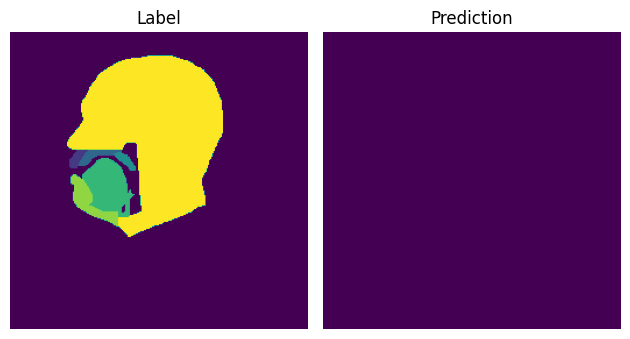

70/70 - 120s - loss: 0.0266 - Mean_DICE: 0.7503 - precision_0: 0.9970 - precision_1: 0.8775 - precision_2: 0.7295 - precision_3: 0.7776 - precision_4: 0.9019 - precision_5: 0.8357 - precision_6: 0.9399 - accuracy_0: 0.9788 - accuracy_1: 0.9788 - accuracy_2: 0.9788 - accuracy_3: 0.9788 - accuracy_4: 0.9788 - accuracy_5: 0.9788 - accuracy_6: 0.9788 - recall_0: 0.9797 - recall_1: 0.4594 - recall_2: 0.5135 - recall_3: 0.1029 - recall_4: 0.9383 - recall_5: 0.9103 - recall_6: 0.9833 - val_loss: 0.7138 - val_Mean_DICE: 0.1379 - val_precision_0: 0.7635 - val_precision_1: 0.0000e+00 - val_precision_2: 0.0000e+00 - val_precision_3: 0.0000e+00 - val_precision_4: 0.0000e+00 - val_precision_5: 0.0000e+00 - val_precision_6: 0.0000e+00 - val_accuracy_0: 0.7635 - val_accuracy_1: 0.7635 - val_accuracy_2: 0.7635 - val_accuracy_3: 0.7635 - val_accuracy_4: 0.7635 - val_accuracy_5: 0.7635 - val_accuracy_6: 0.7635 - val_recall_0: 1.0000 - val_recall_1: 0.0000e+00 - val_recall_2: 0.0000e+00 - val_recall_3: 0

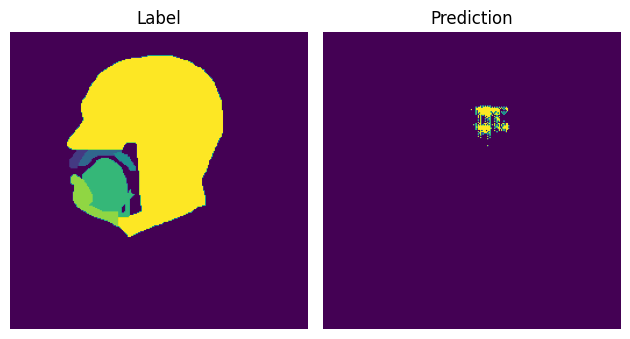

70/70 - 121s - loss: 0.0184 - Mean_DICE: 0.8337 - precision_0: 0.9975 - precision_1: 0.8366 - precision_2: 0.7248 - precision_3: 0.6535 - precision_4: 0.9099 - precision_5: 0.8572 - precision_6: 0.9491 - accuracy_0: 0.9827 - accuracy_1: 0.9827 - accuracy_2: 0.9827 - accuracy_3: 0.9827 - accuracy_4: 0.9827 - accuracy_5: 0.9827 - accuracy_6: 0.9827 - recall_0: 0.9826 - recall_1: 0.8541 - recall_2: 0.8370 - recall_3: 0.6790 - recall_4: 0.9550 - recall_5: 0.9392 - recall_6: 0.9870 - val_loss: 0.8101 - val_Mean_DICE: 0.1350 - val_precision_0: 0.7657 - val_precision_1: 0.0000e+00 - val_precision_2: 0.0000e+00 - val_precision_3: 0.0000e+00 - val_precision_4: 0.0000e+00 - val_precision_5: 0.0000e+00 - val_precision_6: 0.0000e+00 - val_accuracy_0: 0.7635 - val_accuracy_1: 0.7635 - val_accuracy_2: 0.7635 - val_accuracy_3: 0.7635 - val_accuracy_4: 0.7635 - val_accuracy_5: 0.7635 - val_accuracy_6: 0.7635 - val_recall_0: 1.0000 - val_recall_1: 0.0000e+00 - val_recall_2: 0.0000e+00 - val_recall_3: 0

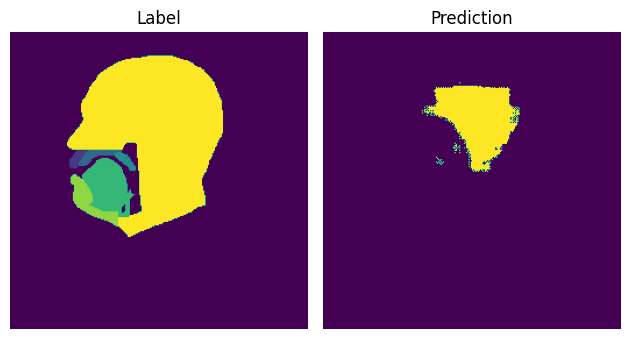

70/70 - 130s - loss: 0.0163 - Mean_DICE: 0.8461 - precision_0: 0.9976 - precision_1: 0.8301 - precision_2: 0.7445 - precision_3: 0.6431 - precision_4: 0.9118 - precision_5: 0.8680 - precision_6: 0.9532 - accuracy_0: 0.9841 - accuracy_1: 0.9841 - accuracy_2: 0.9841 - accuracy_3: 0.9841 - accuracy_4: 0.9841 - accuracy_5: 0.9841 - accuracy_6: 0.9841 - recall_0: 0.9842 - recall_1: 0.8871 - recall_2: 0.8564 - recall_3: 0.7879 - recall_4: 0.9597 - recall_5: 0.9459 - recall_6: 0.9881 - val_loss: 0.7566 - val_Mean_DICE: 0.1443 - val_precision_0: 0.8038 - val_precision_1: 0.0000e+00 - val_precision_2: 0.0000e+00 - val_precision_3: 0.0000e+00 - val_precision_4: 0.0000e+00 - val_precision_5: 0.0000e+00 - val_precision_6: 0.0000e+00 - val_accuracy_0: 0.7635 - val_accuracy_1: 0.7635 - val_accuracy_2: 0.7635 - val_accuracy_3: 0.7635 - val_accuracy_4: 0.7635 - val_accuracy_5: 0.7635 - val_accuracy_6: 0.7635 - val_recall_0: 1.0000 - val_recall_1: 0.0000e+00 - val_recall_2: 0.0000e+00 - val_recall_3: 0

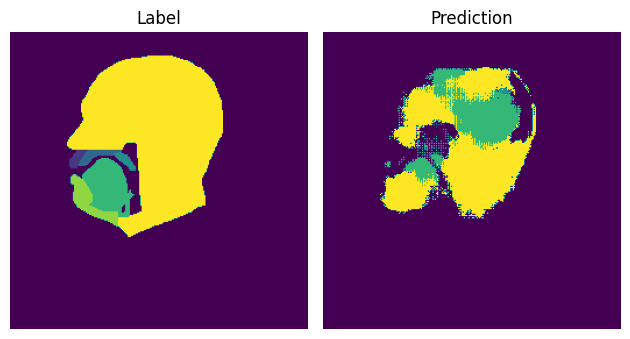

70/70 - 122s - loss: 0.0147 - Mean_DICE: 0.8745 - precision_0: 0.9978 - precision_1: 0.8363 - precision_2: 0.7612 - precision_3: 0.6600 - precision_4: 0.9152 - precision_5: 0.8717 - precision_6: 0.9563 - accuracy_0: 0.9852 - accuracy_1: 0.9852 - accuracy_2: 0.9852 - accuracy_3: 0.9852 - accuracy_4: 0.9852 - accuracy_5: 0.9852 - accuracy_6: 0.9852 - recall_0: 0.9852 - recall_1: 0.8997 - recall_2: 0.8743 - recall_3: 0.8298 - recall_4: 0.9630 - recall_5: 0.9494 - recall_6: 0.9895 - val_loss: 0.3649 - val_Mean_DICE: 0.2335 - val_precision_0: 0.9258 - val_precision_1: 0.0000e+00 - val_precision_2: 0.0000e+00 - val_precision_3: 0.0000e+00 - val_precision_4: 0.0822 - val_precision_5: 0.0000e+00 - val_precision_6: 0.7338 - val_accuracy_0: 0.8445 - val_accuracy_1: 0.8445 - val_accuracy_2: 0.8445 - val_accuracy_3: 0.8445 - val_accuracy_4: 0.8445 - val_accuracy_5: 0.8445 - val_accuracy_6: 0.8445 - val_recall_0: 0.9910 - val_recall_1: 0.0000e+00 - val_recall_2: 0.0000e+00 - val_recall_3: 0.0000e+0

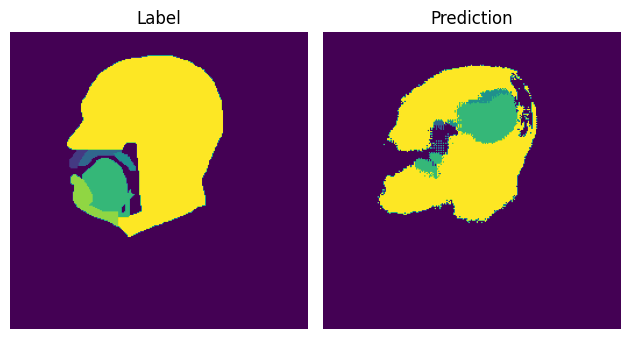

70/70 - 127s - loss: 0.0146 - Mean_DICE: 0.8353 - precision_0: 0.9977 - precision_1: 0.8383 - precision_2: 0.7700 - precision_3: 0.6749 - precision_4: 0.9148 - precision_5: 0.8754 - precision_6: 0.9556 - accuracy_0: 0.9851 - accuracy_1: 0.9851 - accuracy_2: 0.9851 - accuracy_3: 0.9851 - accuracy_4: 0.9851 - accuracy_5: 0.9851 - accuracy_6: 0.9851 - recall_0: 0.9852 - recall_1: 0.9033 - recall_2: 0.8740 - recall_3: 0.8383 - recall_4: 0.9641 - recall_5: 0.9498 - recall_6: 0.9893 - val_loss: 0.3781 - val_Mean_DICE: 0.2568 - val_precision_0: 0.9361 - val_precision_1: 0.0000e+00 - val_precision_2: 0.0216 - val_precision_3: 0.0000e+00 - val_precision_4: 0.0788 - val_precision_5: 0.0000e+00 - val_precision_6: 0.7654 - val_accuracy_0: 0.8787 - val_accuracy_1: 0.8787 - val_accuracy_2: 0.8787 - val_accuracy_3: 0.8787 - val_accuracy_4: 0.8787 - val_accuracy_5: 0.8787 - val_accuracy_6: 0.8787 - val_recall_0: 0.9882 - val_recall_1: 0.0000e+00 - val_recall_2: 0.0045 - val_recall_3: 0.0000e+00 - val_

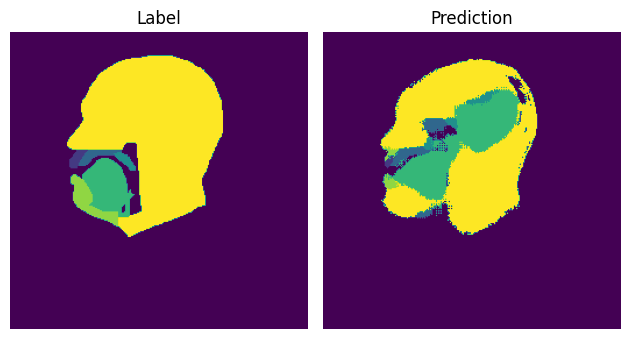

70/70 - 119s - loss: 0.0136 - Mean_DICE: 0.7977 - precision_0: 0.9978 - precision_1: 0.8415 - precision_2: 0.7819 - precision_3: 0.6883 - precision_4: 0.9173 - precision_5: 0.8778 - precision_6: 0.9587 - accuracy_0: 0.9860 - accuracy_1: 0.9860 - accuracy_2: 0.9860 - accuracy_3: 0.9860 - accuracy_4: 0.9860 - accuracy_5: 0.9860 - accuracy_6: 0.9860 - recall_0: 0.9861 - recall_1: 0.9095 - recall_2: 0.8841 - recall_3: 0.8554 - recall_4: 0.9653 - recall_5: 0.9528 - recall_6: 0.9900 - val_loss: 0.2549 - val_Mean_DICE: 0.4240 - val_precision_0: 0.9741 - val_precision_1: 0.3090 - val_precision_2: 0.3182 - val_precision_3: 0.0088 - val_precision_4: 0.2483 - val_precision_5: 0.6972 - val_precision_6: 0.9216 - val_accuracy_0: 0.8947 - val_accuracy_1: 0.8947 - val_accuracy_2: 0.8947 - val_accuracy_3: 0.8947 - val_accuracy_4: 0.8947 - val_accuracy_5: 0.8947 - val_accuracy_6: 0.8947 - val_recall_0: 0.9833 - val_recall_1: 0.2368 - val_recall_2: 0.5510 - val_recall_3: 0.0031 - val_recall_4: 0.7330 - v

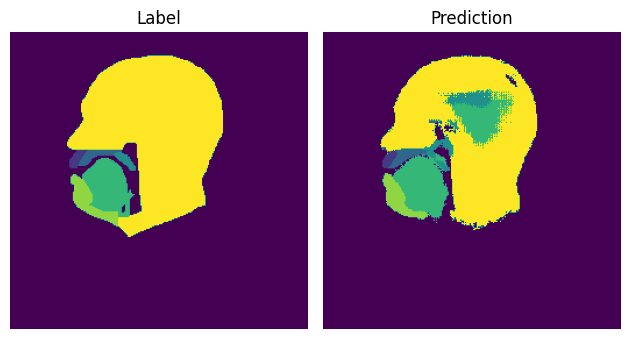

70/70 - 120s - loss: 0.0132 - Mean_DICE: 0.8743 - precision_0: 0.9979 - precision_1: 0.8451 - precision_2: 0.7844 - precision_3: 0.6905 - precision_4: 0.9181 - precision_5: 0.8792 - precision_6: 0.9603 - accuracy_0: 0.9865 - accuracy_1: 0.9865 - accuracy_2: 0.9865 - accuracy_3: 0.9865 - accuracy_4: 0.9865 - accuracy_5: 0.9865 - accuracy_6: 0.9865 - recall_0: 0.9866 - recall_1: 0.9123 - recall_2: 0.8863 - recall_3: 0.8614 - recall_4: 0.9661 - recall_5: 0.9518 - recall_6: 0.9904 - val_loss: 0.1719 - val_Mean_DICE: 0.5781 - val_precision_0: 0.9832 - val_precision_1: 0.7112 - val_precision_2: 0.5097 - val_precision_3: 0.1576 - val_precision_4: 0.3829 - val_precision_5: 0.8122 - val_precision_6: 0.9832 - val_accuracy_0: 0.9243 - val_accuracy_1: 0.9243 - val_accuracy_2: 0.9243 - val_accuracy_3: 0.9243 - val_accuracy_4: 0.9243 - val_accuracy_5: 0.9243 - val_accuracy_6: 0.9243 - val_recall_0: 0.9854 - val_recall_1: 0.7638 - val_recall_2: 0.8513 - val_recall_3: 0.5308 - val_recall_4: 0.9863 - v

KeyboardInterrupt: ignored

In [ ]:
history = model.fit(
    x=x_train,
    y=y_train,
    epochs = 100,
    batch_size = 15,
    validation_data = (x_val, y_val),
    callbacks=[early_stopping, scheduler,tensor_board, VizCallback(np.expand_dims(x_val[0],axis=0), np.expand_dims(y_val[0],axis=0), predictions_path)],
    verbose=2
    )

#### SAVINGS

In [ ]:
name_path = 'model_aug_weights2_skipconnection'
folder_path = "/content/gdrive/MyDrive/Voice tract segmentation/models/" + name_path

try:
    os.makedirs(folder_path)
    print(f"Folder '{folder_path}' created successfully.")
except FileExistsError:
    print(f"Folder '{folder_path}' already exists.")

Folder '/content/gdrive/MyDrive/Voice tract segmentation/models/model_aug_weights2_skipconnection' already exists.


In [ ]:
history_df = pd.DataFrame(history.history)

excel_file_path = '/content/gdrive/MyDrive/Voice tract segmentation/models/model_row_images/training_history.xlsx'
history_df.to_excel(excel_file_path, index=False)

In [ ]:
model.save(folder_path + '/aug_weights2_skipconnection')

#### MODEL LOADING

In [ ]:
model = tfk.models.load_model('/content/gdrive/MyDrive/Voice tract segmentation/models/model_aug_weights2_skipconnection/aug_weights2_skipconnection', custom_objects={'Mean_DICE': Mean_DICE, 'loss': cross_entropy})

#### GRAPHS

In [ ]:
best_epoch = np.argmax(history.history['val_Mean_DICE'])
best_epoch

NameError: ignored

In [ ]:
# CROSS ENTROPY
plt.figure(figsize=(18,3))
plt.plot(history.history['loss'], label='Training', alpha=.8, color='#ff7f0e', linewidth=2)
plt.plot(history.history['val_loss'], label='Validation', alpha=.9, color='#5a9aa5', linewidth=2)
plt.axvline(x=best_epoch, label='Best epoch', alpha=.3, ls='--', color='#5a9aa5')
plt.title('Cross Entropy')
plt.legend()
plt.grid(alpha=.3)
plt.savefig(folder_path +'/cross_entropy.png')
plt.show()

# MEAN DICE
plt.figure(figsize=(18,3))
plt.plot(history.history['Mean_DICE'], label='Training', alpha=.8, color='#ff7f0e', linewidth=2)
plt.plot(history.history['val_Mean_DICE'], label='Validation', alpha=.9, color='#5a9aa5', linewidth=2)
plt.axvline(x=best_epoch, label='Best epoch', alpha=.3, ls='--', color='#5a9aa5')
plt.title('Mean_DICE')
plt.legend()
plt.grid(alpha=.3)
plt.savefig(folder_path +'/Mean_dice.png')
plt.show()

In [ ]:
# PRECISION
for i in range (NUM_CLASSES):
  plt.figure(figsize=(18,3))
  plt.plot(history.history[f'precision_{i}'], label='Training', alpha=.8, color='#ff7f0e', linewidth=2)
  plt.plot(history.history[f'val_precision_{i}'], label='Validation', alpha=.9, color='#5a9aa5', linewidth=2)
  plt.axvline(x=best_epoch, label='Best epoch', alpha=.3, ls='--', color='#5a9aa5')
  plt.title(f'Precision for class {i}')
  plt.legend()
  plt.grid(alpha=.3)
  #plt.savefig(folder_path +'/precision_{i}.png')
  plt.show()

In [ ]:
# ACCURACY
for i in range (NUM_CLASSES):
  plt.figure(figsize=(18,3))
  plt.plot(history.history[f'accuracy_{i}'], label='Training', alpha=.8, color='#ff7f0e', linewidth=2)
  plt.plot(history.history[f'val_accuracy_{i}'], label='Validation', alpha=.9, color='#5a9aa5', linewidth=2)
  plt.axvline(x=best_epoch, label='Best epoch', alpha=.3, ls='--', color='#5a9aa5')
  plt.title(f'Accuracy for class {i}')
  plt.legend()
  plt.grid(alpha=.3)
  #plt.savefig(folder_path +'/accuracy_{i}.png')
  plt.show()

In [ ]:
# RECALL
for i in range (NUM_CLASSES):
  plt.figure(figsize=(18,3))
  plt.plot(history.history[f'recall_{i}'], label='Training', alpha=.8, color='#ff7f0e', linewidth=2)
  plt.plot(history.history[f'val_recall_{i}'], label='Validation', alpha=.9, color='#5a9aa5', linewidth=2)
  plt.axvline(x=best_epoch, label='Best epoch', alpha=.3, ls='--', color='#5a9aa5')
  plt.title(f'Recall for class {i}')
  plt.legend()
  plt.grid(alpha=.3)
  #plt.savefig(folder_path +'/Recall_{i}.png')
  plt.show()

NameError: ignored

<Figure size 1800x300 with 0 Axes>

#### PREDICTIONS

In [ ]:
predictions = model.predict(x_test/255, verbose=0)
predictions.shape

(150, 256, 256, 7)

ARGMAX

In [ ]:
argmax_indexes = tf.math.argmax(predictions,axis=-1)

<ipython-input-28-bc55de3fae87>:19: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(2, binary_images.shape[-1], i + 8)


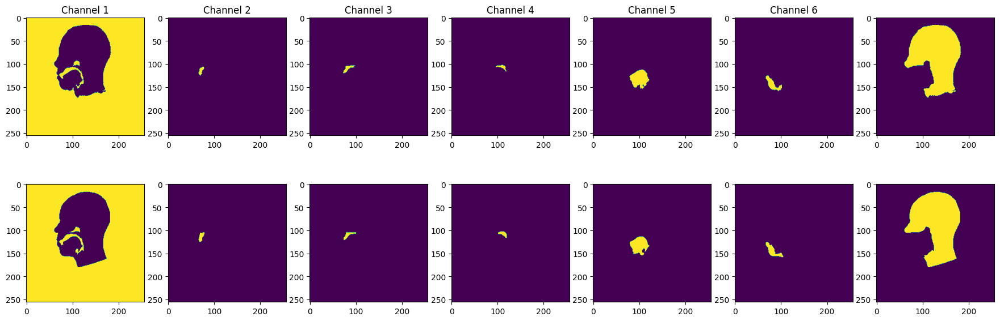

In [ ]:
# Plot of y_test images vs predicted ones after argmax application
binary_masks = []
j = random.randint(0, len(y_test))

# Iteration over each channel
for channel_index in range(7):
    # Creation of a binary mask for the current channel
    binary_mask_channel = tf.cast(tf.equal(argmax_indexes, channel_index), dtype=tf.float32)
    binary_masks.append(binary_mask_channel)

# Convertion of the list of binary masks to a tensor along the last axis
binary_images = tf.stack(binary_masks, axis=-1)

# Display the binary masks for each channel
plt.figure(figsize=(22, 7))

for i in range(binary_images.shape[-1]):
    plt.title(f'Channel {i}')
    plt.subplot(2, binary_images.shape[-1], i + 8)
    plt.imshow(y_test[j, :, :, i])
    plt.subplot(2, binary_images.shape[-1], i + 1)
    plt.imshow(binary_images[j, :, :, i])

plt.show()

In [ ]:
j

109

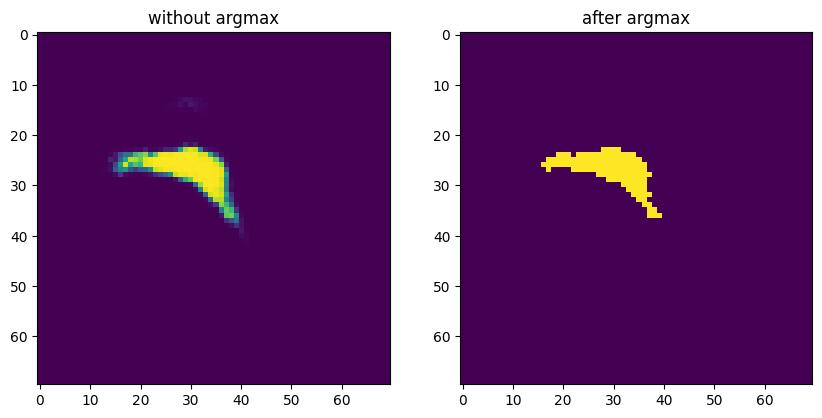

In [ ]:
# Plot of the a layer before and after argmax
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(predictions[j,80:150,80:150,3])
plt.title('without argmax')

plt.subplot(1, 2, 2)
plt.imshow(binary_images[j,80:150,80:150,3])
plt.title('after argmax')

plt.show()
#plt.savefig(folder_path +'/comparison_all.png')

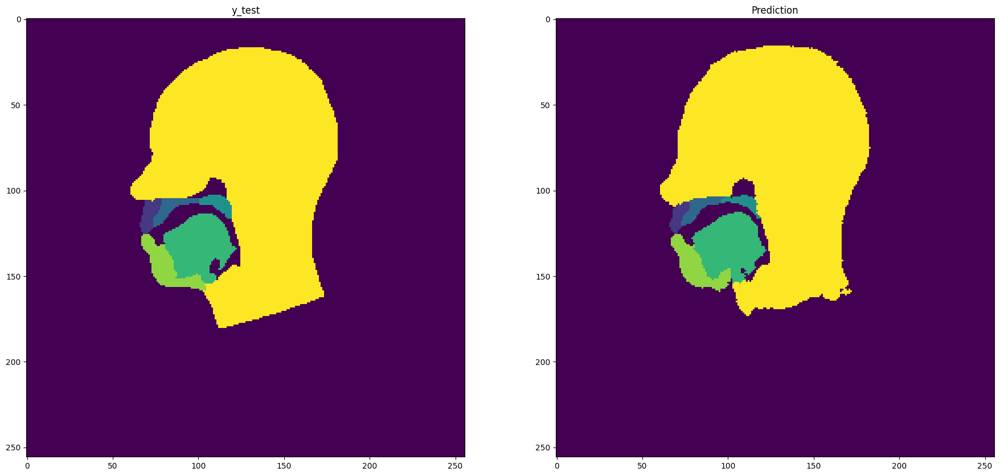

In [ ]:
# Plot of the total layers
plt.figure(figsize=(22, 10))

plt.subplot(1, 2, 1)
plt.imshow(y_test[j].argmax(axis=-1))
plt.title('y_test')

plt.subplot(1, 2, 2)
plt.imshow(argmax_indexes[j])
plt.title('Prediction')

plt.show()
#plt.savefig(folder_path +'/comparison_all.png')

#### MEAN DICE CALCULATIONS

In [ ]:
def calculate_dice_per_class(y_true, y_pred, num_classes, smooth_factor=1e-9):
    axis = None
    y_true = tf.cast(y_true, dtype=tf.float32)
    y_pred = tf.cast(y_pred, dtype=tf.float32)

    if len(y_pred.shape) == 4:
        axis = (1, 2)
    elif len(y_pred.shape) == 5:
        axis = (1, 2, 3)

    dice_per_class = tf.zeros(num_classes, dtype=tf.float32)

    for c in range(num_classes):
        abs_label = tf.math.reduce_sum(y_true[..., c], axis=axis)
        abs_pred = tf.math.reduce_sum(y_pred[..., c], axis=axis)
        MD_batch_denom = tf.math.add(tf.math.add(abs_label, abs_pred), smooth_factor)
        MD_batch_num = tf.math.add(2 * tf.math.reduce_sum(tf.math.multiply(y_true[..., c], y_pred[..., c]), axis=axis),
                                   smooth_factor)
        dice_image = tf.math.divide(MD_batch_num, MD_batch_denom)
        dice_per_class = tf.tensor_scatter_nd_add(dice_per_class, indices=[[c]], updates=[tf.reduce_mean(dice_image)])

    return dice_per_class.numpy()

##### MEAN_DICE PRE ARGMAX

In [ ]:
dice_values = calculate_dice_per_class(y_test, predictions, NUM_CLASSES)

for class_index, dice_coefficient in enumerate(dice_values):
    print(f'Dice Coefficient for Class {class_index}: {dice_coefficient}')

Dice Coefficient for Class 0: 0.9895089864730835
Dice Coefficient for Class 1: 0.8398969769477844
Dice Coefficient for Class 2: 0.821474552154541
Dice Coefficient for Class 3: 0.7288137674331665
Dice Coefficient for Class 4: 0.9251061081886292
Dice Coefficient for Class 5: 0.8651764988899231
Dice Coefficient for Class 6: 0.9608966112136841


In [ ]:
mean_dice_classes = np.mean(dice_values)
mean_dice_classes

0.8758391

##### MEAN_DICE POST ARGMAX

In [ ]:
dice_values = calculate_dice_per_class(y_test, binary_images, NUM_CLASSES)

for class_index, dice_coefficient in enumerate(dice_values):
    print(f'Dice Coefficient for Class {class_index}: {dice_coefficient}')

Dice Coefficient for Class 0: 0.9908798336982727
Dice Coefficient for Class 1: 0.8735650777816772
Dice Coefficient for Class 2: 0.8590633273124695
Dice Coefficient for Class 3: 0.7710403203964233
Dice Coefficient for Class 4: 0.9397682547569275
Dice Coefficient for Class 5: 0.8976292014122009
Dice Coefficient for Class 6: 0.9653273224830627


In [ ]:
mean_dice_classes = np.mean(dice_values)
mean_dice_classes

0.8996105

## POSTPROCESSING

### MEDIAN FILTER

In [ ]:
def apply_median_filter(predictions):
    filtered_predictions = []
    for prediction in predictions:
        # Assuming prediction shape is (height, width, num_classes)
        filtered_mask = median_filter(prediction, size=(2, 2, 1))
        filtered_predictions.append(filtered_mask)

    return np.array(filtered_predictions)

def apply_median_filter_to_channel(predictions, channel_to_filter):
    filtered_predictions = []
    for prediction in predictions:
        filtered_channel = median_filter(prediction[..., channel_to_filter], size=(2, 2))
        filtered_mask = np.copy(prediction)
        filtered_mask[..., channel_to_filter] = filtered_channel
        filtered_predictions.append(filtered_mask)

    return np.array(filtered_predictions)

In [ ]:
# Median filter on all classes
filtered_images = apply_median_filter(binary_images)

In [ ]:
# Median filter only on class 3
filtered_images_channel3 = apply_median_filter_to_channel(binary_images, 3)

In [ ]:
dice_values_allfilt = calculate_dice_per_class(y_test, filtered_images, NUM_CLASSES)

for class_index, dice_coefficient in enumerate(dice_values_allfilt):
    print(f'Dice Coefficient for Class {class_index}: {dice_coefficient}')

Dice Coefficient for Class 0: 0.9912075996398926
Dice Coefficient for Class 1: 0.8325411081314087
Dice Coefficient for Class 2: 0.8268226385116577
Dice Coefficient for Class 3: 0.8005566596984863
Dice Coefficient for Class 4: 0.9286894798278809
Dice Coefficient for Class 5: 0.8965072631835938
Dice Coefficient for Class 6: 0.9635629057884216


In [ ]:
mean_dice_classes_all = np.mean(dice_values_allfilt)
mean_dice_classes_all

0.89141256

In [ ]:
dice_values = calculate_dice_per_class(y_test, filtered_images_channel3, NUM_CLASSES)

for class_index, dice_coefficient in enumerate(dice_values):
    print(f'Dice Coefficient for Class {class_index}: {dice_coefficient}')

Dice Coefficient for Class 0: 0.9908798336982727
Dice Coefficient for Class 1: 0.8735650777816772
Dice Coefficient for Class 2: 0.8590633273124695
Dice Coefficient for Class 3: 0.8005566596984863
Dice Coefficient for Class 4: 0.9397682547569275
Dice Coefficient for Class 5: 0.8976292014122009
Dice Coefficient for Class 6: 0.9653273224830627


In [ ]:
mean_dice_classes = np.mean(dice_values)
mean_dice_classes

0.90382713

<ipython-input-42-fed110e5671b>:4: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(2, filtered_images.shape[-1], i + 8)


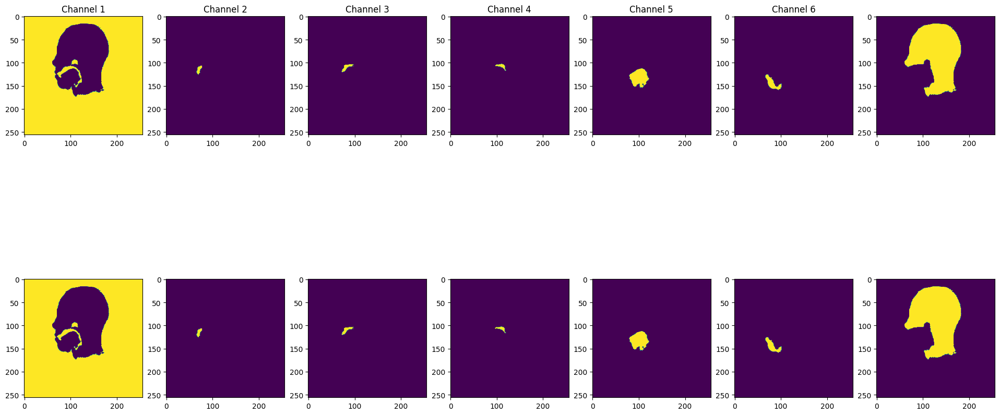

In [ ]:
plt.figure(figsize=(24, 12))
for i in range(filtered_images.shape[-1]):
    plt.title(f'Channel {i}')
    plt.subplot(2, filtered_images.shape[-1], i + 8)
    plt.imshow(binary_images[j, :, :, i])
    plt.subplot(2, filtered_images.shape[-1], i + 1)
    plt.imshow(filtered_images_channel3[j, :, :, i])

plt.show()

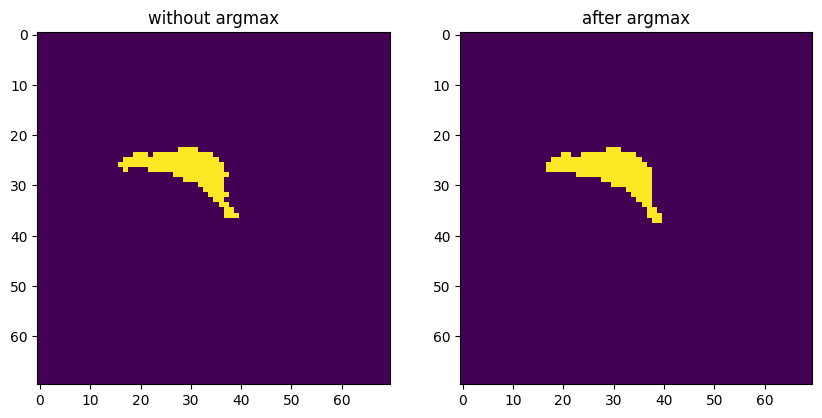

In [ ]:
# Plot of the a layer before and after argmax
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(binary_images[j,80:150,80:150,3])
plt.title('without median filter')

plt.subplot(1, 2, 2)
plt.imshow(filtered_images_channel3[j,80:150,80:150,3])
plt.title('median filter on channel 3')

plt.show()
#plt.savefig(folder_path +'/comparison_all.png')